In [2]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Conv2D, Add, ReLU, Lambda
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras import losses

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
TRAIN_HR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\train\high_res"
TRAIN_LR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\train\low_res"
VAL_HR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\val\high_res"
VAL_LR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\val\low_res"
TEST_HR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\test\high_res"
TEST_LR_PATH = r"C:\Users\Yousef\Desktop\temp\dataset\test\low_res"

def load_paired_images(lr_dir, hr_dir, lr_size=(128, 128), hr_size=(256, 256)):
    lr_images, hr_images = [], []
    filenames = sorted(os.listdir(lr_dir))

    for filename in filenames:
        lr_path = os.path.join(lr_dir, filename)
        hr_path = os.path.join(hr_dir, filename)

        if os.path.exists(lr_path) and os.path.exists(hr_path):
            lr_img = cv2.imread(lr_path)
            hr_img = cv2.imread(hr_path)

            if lr_img is not None and hr_img is not None:
                lr_img = cv2.resize(cv2.cvtColor(lr_img, cv2.COLOR_BGR2RGB), lr_size)
                hr_img = cv2.resize(cv2.cvtColor(hr_img, cv2.COLOR_BGR2RGB), hr_size)

                lr_images.append(lr_img / 255.0)
                hr_images.append(hr_img / 255.0)

    return np.array(lr_images), np.array(hr_images)

lr_train, hr_train = load_paired_images(TRAIN_LR_PATH, TRAIN_HR_PATH, hr_size=(256, 256))
lr_val, hr_val = load_paired_images(VAL_LR_PATH, VAL_HR_PATH, hr_size=(256, 256))
lr_test, hr_test = load_paired_images(TEST_LR_PATH, TEST_HR_PATH, hr_size=(256, 256))

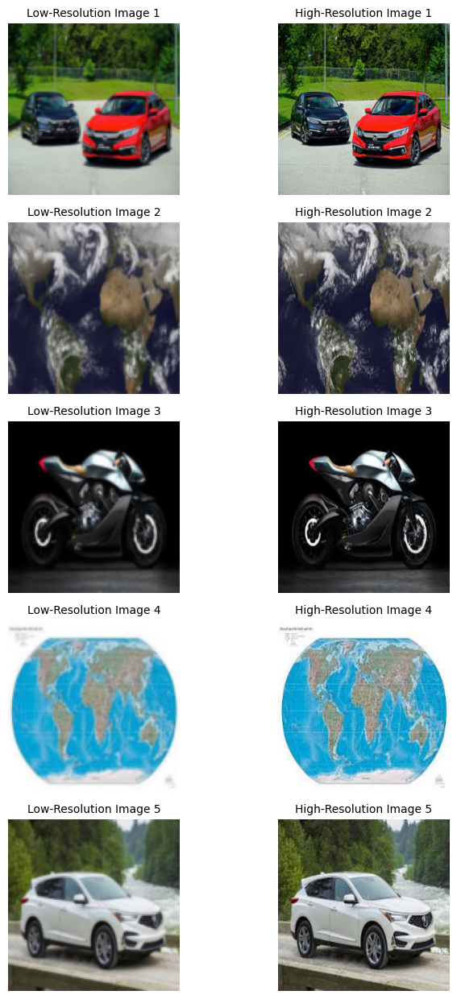

In [5]:
def show_dataset_samples(lr_images, hr_images, n=5):
    plt.figure(figsize=(8, 2.5 * n))
    for i in range(n):
        plt.subplot(n, 2, 2*i + 1)
        plt.imshow(lr_images[i])
        plt.title(f"Low-Resolution Image {i+1}", fontsize=10)
        plt.axis("off")

        plt.subplot(n, 2, 2*i + 2)
        plt.imshow(hr_images[i])
        plt.title(f"High-Resolution Image {i+1}", fontsize=10)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_dataset_samples(lr_train, hr_train, n=5)

In [ ]:
def psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

def ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

def build_srcnn():
    inputs = Input(shape=(None, None, 3))
    x = Conv2D(64, (9, 9), activation='relu', padding='same')(inputs)
    x = Conv2D(32, (1, 1), activation='relu', padding='same')(x)
    x = tf.keras.layers.UpSampling2D(size=(2, 2))(x)
    x = Conv2D(3, (5, 5), activation='linear', padding='same')(x)
    return Model(inputs, x)

model = build_srcnn()
model.compile(optimizer='adam', loss='mse', metrics=[psnr, ssim])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, None, None, 64) │        15,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, None, None, 32) │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, None, None, 32) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, None, None, 3)  │         2,403 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,099 (78.51 KB)

 Trainable params: 20,099 (78.51 KB)

 Non-trainable params: 0 (0.00 B)

In [7]:
early_stop = EarlyStopping(monitor='val_psnr', patience=10, mode='max', restore_best_weights=True)
checkpoint = ModelCheckpoint("best_srcnn_model.h5", monitor='val_psnr', save_best_only=True, mode='max')

history = model.fit(
    lr_train, hr_train,
    validation_data=(lr_val, hr_val),
    epochs=150,
    batch_size=16,
    callbacks=[early_stop, checkpoint]
)

Epoch 1/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - loss: 0.0720 - psnr: 14.6854 - ssim: 0.4109

43/43 ━━━━━━━━━━━━━━━━━━━━ 32s 691ms/step - loss: 0.0711 - psnr: 14.7405 - ssim: 0.4123 - val_loss: 0.0138 - val_psnr: 19.1702 - val_ssim: 0.5176
Epoch 2/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 623ms/step - loss: 0.0115 - psnr: 20.1404 - ssim: 0.5504

43/43 ━━━━━━━━━━━━━━━━━━━━ 31s 714ms/step - loss: 0.0115 - psnr: 20.1543 - ssim: 0.5510 - val_loss: 0.0073 - val_psnr: 22.0835 - val_ssim: 0.6261
Epoch 3/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0066 - psnr: 22.4979 - ssim: 0.6478

43/43 ━━━━━━━━━━━━━━━━━━━━ 32s 735ms/step - loss: 0.0066 - psnr: 22.5073 - ssim: 0.6481 - val_loss: 0.0052 - val_psnr: 23.6685 - val_ssim: 0.6843
Epoch 4/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 590ms/step - loss: 0.0049 - psnr: 23.8717 - ssim: 0.6906

43/43 ━━━━━━━━━━━━━━━━━━━━ 39s 683ms/step - loss: 0.0048 - psnr: 23.8837 - ssim: 0.6911 - val_loss: 0.0046 - val_psnr: 24.0376 - val_ssim: 0.7260
Epoch 5/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 677ms/step - loss: 0.0040 - psnr: 24.7511 - ssim: 0.7398 - val_loss: 0.0055 - val_psnr: 23.1709 - val_ssim: 0.7410
Epoch 6/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - loss: 0.0046 - psnr: 24.1377 - ssim: 0.7515

43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 637ms/step - loss: 0.0046 - psnr: 24.1565 - ssim: 0.7518 - val_loss: 0.0033 - val_psnr: 25.6752 - val_ssim: 0.7687
Epoch 7/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 602ms/step - loss: 0.0031 - psnr: 25.8804 - ssim: 0.7763

43/43 ━━━━━━━━━━━━━━━━━━━━ 45s 726ms/step - loss: 0.0031 - psnr: 25.8840 - ssim: 0.7764 - val_loss: 0.0031 - val_psnr: 26.0135 - val_ssim: 0.7842
Epoch 8/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - loss: 0.0027 - psnr: 26.5595 - ssim: 0.7951

43/43 ━━━━━━━━━━━━━━━━━━━━ 38s 648ms/step - loss: 0.0027 - psnr: 26.5563 - ssim: 0.7950 - val_loss: 0.0028 - val_psnr: 26.4135 - val_ssim: 0.7943
Epoch 9/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 598ms/step - loss: 0.0027 - psnr: 26.6212 - ssim: 0.8006

43/43 ━━━━━━━━━━━━━━━━━━━━ 43s 680ms/step - loss: 0.0027 - psnr: 26.6231 - ssim: 0.8007 - val_loss: 0.0027 - val_psnr: 26.6751 - val_ssim: 0.8063
Epoch 10/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 556ms/step - loss: 0.0025 - psnr: 26.8371 - ssim: 0.8081

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 642ms/step - loss: 0.0025 - psnr: 26.8373 - ssim: 0.8082 - val_loss: 0.0025 - val_psnr: 26.9923 - val_ssim: 0.8142
Epoch 11/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 649ms/step - loss: 0.0025 - psnr: 26.8369 - ssim: 0.8167 - val_loss: 0.0027 - val_psnr: 26.4728 - val_ssim: 0.8191
Epoch 12/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - loss: 0.0025 - psnr: 26.8161 - ssim: 0.8246

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 648ms/step - loss: 0.0025 - psnr: 26.8165 - ssim: 0.8246 - val_loss: 0.0023 - val_psnr: 27.3277 - val_ssim: 0.8262
Epoch 13/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - loss: 0.0022 - psnr: 27.5720 - ssim: 0.8347

43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 659ms/step - loss: 0.0022 - psnr: 27.5708 - ssim: 0.8347 - val_loss: 0.0023 - val_psnr: 27.4951 - val_ssim: 0.8319
Epoch 14/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 646ms/step - loss: 0.0021 - psnr: 27.8900 - ssim: 0.8391 - val_loss: 0.0023 - val_psnr: 27.4384 - val_ssim: 0.8356
Epoch 15/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - loss: 0.0022 - psnr: 27.4445 - ssim: 0.8390

43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 636ms/step - loss: 0.0022 - psnr: 27.4450 - ssim: 0.8390 - val_loss: 0.0022 - val_psnr: 27.5969 - val_ssim: 0.8396
Epoch 16/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 552ms/step - loss: 0.0020 - psnr: 27.8816 - ssim: 0.8448

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 635ms/step - loss: 0.0020 - psnr: 27.8803 - ssim: 0.8448 - val_loss: 0.0021 - val_psnr: 27.8240 - val_ssim: 0.8433
Epoch 17/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 553ms/step - loss: 0.0018 - psnr: 28.4650 - ssim: 0.8554

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 639ms/step - loss: 0.0018 - psnr: 28.4575 - ssim: 0.8552 - val_loss: 0.0020 - val_psnr: 27.9734 - val_ssim: 0.8460
Epoch 18/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 551ms/step - loss: 0.0019 - psnr: 28.2403 - ssim: 0.8524

43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 633ms/step - loss: 0.0019 - psnr: 28.2410 - ssim: 0.8524 - val_loss: 0.0020 - val_psnr: 28.0237 - val_ssim: 0.8501
Epoch 19/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 636ms/step - loss: 0.0029 - psnr: 26.9975 - ssim: 0.8529 - val_loss: 0.0026 - val_psnr: 26.6666 - val_ssim: 0.8437
Epoch 20/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 568ms/step - loss: 0.0020 - psnr: 27.8756 - ssim: 0.8514

43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 655ms/step - loss: 0.0020 - psnr: 27.8817 - ssim: 0.8515 - val_loss: 0.0020 - val_psnr: 28.0956 - val_ssim: 0.8516
Epoch 21/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 553ms/step - loss: 0.0019 - psnr: 28.3119 - ssim: 0.8546

43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 636ms/step - loss: 0.0019 - psnr: 28.3141 - ssim: 0.8547 - val_loss: 0.0019 - val_psnr: 28.3090 - val_ssim: 0.8552
Epoch 22/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 636ms/step - loss: 0.0019 - psnr: 28.3487 - ssim: 0.8594 - val_loss: 0.0019 - val_psnr: 28.2140 - val_ssim: 0.8569
Epoch 23/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - loss: 0.0019 - psnr: 28.2644 - ssim: 0.8590

43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 637ms/step - loss: 0.0019 - psnr: 28.2695 - ssim: 0.8591 - val_loss: 0.0018 - val_psnr: 28.4788 - val_ssim: 0.8596
Epoch 24/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 560ms/step - loss: 0.0017 - psnr: 28.8015 - ssim: 0.8671

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 642ms/step - loss: 0.0017 - psnr: 28.7996 - ssim: 0.8671 - val_loss: 0.0018 - val_psnr: 28.5712 - val_ssim: 0.8620
Epoch 25/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 561ms/step - loss: 0.0017 - psnr: 28.6824 - ssim: 0.8666

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 644ms/step - loss: 0.0017 - psnr: 28.6856 - ssim: 0.8666 - val_loss: 0.0018 - val_psnr: 28.6886 - val_ssim: 0.8640
Epoch 26/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 665ms/step - loss: 0.0017 - psnr: 28.5932 - ssim: 0.8677 - val_loss: 0.0046 - val_psnr: 23.9123 - val_ssim: 0.8500
Epoch 27/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 637ms/step - loss: 0.0027 - psnr: 26.6757 - ssim: 0.8606 - val_loss: 0.0018 - val_psnr: 28.5964 - val_ssim: 0.8631
Epoch 28/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 643ms/step - loss: 0.0016 - psnr: 28.8208 - ssim: 0.8719 - val_loss: 0.0017 - val_psnr: 28.6648 - val_ssim: 0.8662
Epoch 29/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 559ms/step - loss: 0.0016 - psnr: 29.0379 - ssim: 0.8715

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 643ms/step - loss: 0.0016 - psnr: 29.0366 - ssim: 0.8715 - val_loss: 0.0017 - val_psnr: 28.8622 - val_ssim: 0.8683
Epoch 30/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 558ms/step - loss: 0.0016 - psnr: 29.0717 - ssim: 0.8684

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 641ms/step - loss: 0.0016 - psnr: 29.0733 - ssim: 0.8685 - val_loss: 0.0017 - val_psnr: 28.9061 - val_ssim: 0.8699
Epoch 31/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 557ms/step - loss: 0.0015 - psnr: 29.1453 - ssim: 0.8739

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 648ms/step - loss: 0.0015 - psnr: 29.1464 - ssim: 0.8739 - val_loss: 0.0016 - val_psnr: 28.9823 - val_ssim: 0.8717
Epoch 32/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 567ms/step - loss: 0.0015 - psnr: 29.2882 - ssim: 0.8775

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 655ms/step - loss: 0.0015 - psnr: 29.2854 - ssim: 0.8775 - val_loss: 0.0016 - val_psnr: 29.0545 - val_ssim: 0.8731
Epoch 33/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 582ms/step - loss: 0.0016 - psnr: 28.9031 - ssim: 0.8760

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 665ms/step - loss: 0.0016 - psnr: 28.9051 - ssim: 0.8760 - val_loss: 0.0016 - val_psnr: 29.0875 - val_ssim: 0.8741
Epoch 34/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 551ms/step - loss: 0.0015 - psnr: 29.3336 - ssim: 0.8769

43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 633ms/step - loss: 0.0015 - psnr: 29.3339 - ssim: 0.8770 - val_loss: 0.0016 - val_psnr: 29.1523 - val_ssim: 0.8755
Epoch 35/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 557ms/step - loss: 0.0015 - psnr: 29.3289 - ssim: 0.8799

43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 640ms/step - loss: 0.0015 - psnr: 29.3306 - ssim: 0.8799 - val_loss: 0.0016 - val_psnr: 29.1897 - val_ssim: 0.8765
Epoch 36/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 640ms/step - loss: 0.0015 - psnr: 29.3094 - ssim: 0.8819 - val_loss: 0.0020 - val_psnr: 27.7303 - val_ssim: 0.8726
Epoch 37/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 665ms/step - loss: 0.0019 - psnr: 28.0541 - ssim: 0.8761 - val_loss: 0.0016 - val_psnr: 29.0379 - val_ssim: 0.8765
Epoch 38/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 642ms/step - loss: 0.0015 - psnr: 29.2135 - ssim: 0.8796 - val_loss: 0.0016 - val_psnr: 29.1690 - val_ssim: 0.8783
Epoch 39/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 643ms/step - loss: 0.0015 - psnr: 29.3986 - ssim: 0.8839 - val_loss: 0.0018 - val_psnr: 28.4732 - val_ssim: 0.8775
Epoch 40/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 648ms/step - loss: 0.0016 - psnr: 28.8052 - ssim: 0.8813 - val_loss: 0.0016 - val_psnr: 28.8455 - val_ssim: 0.8795
Epoch 41/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 558ms/step - los

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 643ms/step - loss: 0.0015 - psnr: 29.1094 - ssim: 0.8833 - val_loss: 0.0015 - val_psnr: 29.2796 - val_ssim: 0.8805
Epoch 42/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 586ms/step - loss: 0.0014 - psnr: 29.6228 - ssim: 0.8865

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 670ms/step - loss: 0.0014 - psnr: 29.6219 - ssim: 0.8865 - val_loss: 0.0015 - val_psnr: 29.3907 - val_ssim: 0.8820
Epoch 43/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 653ms/step - loss: 0.0014 - psnr: 29.8522 - ssim: 0.8886 - val_loss: 0.0016 - val_psnr: 29.0423 - val_ssim: 0.8824
Epoch 44/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 647ms/step - loss: 0.0016 - psnr: 29.1186 - ssim: 0.8857 - val_loss: 0.0021 - val_psnr: 27.4529 - val_ssim: 0.8798
Epoch 45/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 654ms/step - loss: 0.0020 - psnr: 27.7414 - ssim: 0.8857 - val_loss: 0.0016 - val_psnr: 28.9263 - val_ssim: 0.8810
Epoch 46/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 558ms/step - loss: 0.0015 - psnr: 29.3761 - ssim: 0.8849

43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 640ms/step - loss: 0.0015 - psnr: 29.3795 - ssim: 0.8849 - val_loss: 0.0015 - val_psnr: 29.4118 - val_ssim: 0.8830
Epoch 47/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 562ms/step - loss: 0.0014 - psnr: 29.4969 - ssim: 0.8837

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 645ms/step - loss: 0.0014 - psnr: 29.5012 - ssim: 0.8838 - val_loss: 0.0015 - val_psnr: 29.5163 - val_ssim: 0.8846
Epoch 48/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 556ms/step - loss: 0.0014 - psnr: 29.6624 - ssim: 0.8895

43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 638ms/step - loss: 0.0014 - psnr: 29.6652 - ssim: 0.8895 - val_loss: 0.0015 - val_psnr: 29.5535 - val_ssim: 0.8855
Epoch 49/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 561ms/step - loss: 0.0014 - psnr: 29.6244 - ssim: 0.8880

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 644ms/step - loss: 0.0014 - psnr: 29.6289 - ssim: 0.8881 - val_loss: 0.0015 - val_psnr: 29.5635 - val_ssim: 0.8864
Epoch 50/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 561ms/step - loss: 0.0014 - psnr: 29.5950 - ssim: 0.8875

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 647ms/step - loss: 0.0014 - psnr: 29.5966 - ssim: 0.8876 - val_loss: 0.0014 - val_psnr: 29.6079 - val_ssim: 0.8871
Epoch 51/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - loss: 0.0015 - psnr: 29.2871 - ssim: 0.8824

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 647ms/step - loss: 0.0015 - psnr: 29.2977 - ssim: 0.8826 - val_loss: 0.0014 - val_psnr: 29.6516 - val_ssim: 0.8877
Epoch 52/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - loss: 0.0014 - psnr: 29.7170 - ssim: 0.8895

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 646ms/step - loss: 0.0014 - psnr: 29.7213 - ssim: 0.8895 - val_loss: 0.0014 - val_psnr: 29.6695 - val_ssim: 0.8883
Epoch 53/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 645ms/step - loss: 0.0013 - psnr: 29.9582 - ssim: 0.8916 - val_loss: 0.0053 - val_psnr: 23.4188 - val_ssim: 0.8579
Epoch 54/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 647ms/step - loss: 0.0056 - psnr: 24.3073 - ssim: 0.8640 - val_loss: 0.0021 - val_psnr: 27.6617 - val_ssim: 0.8681
Epoch 55/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 637ms/step - loss: 0.0018 - psnr: 28.1995 - ssim: 0.8789 - val_loss: 0.0019 - val_psnr: 28.0110 - val_ssim: 0.8801
Epoch 56/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 646ms/step - loss: 0.0016 - psnr: 28.9620 - ssim: 0.8837 - val_loss: 0.0015 - val_psnr: 29.3869 - val_ssim: 0.8838
Epoch 57/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 651ms/step - loss: 0.0014 - psnr: 29.6620 - ssim: 0.8884 - val_loss: 0.0015 - val_psnr: 29.2766 - val_ssim: 0.8863
Epoch 58/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 682ms/step - lo

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 656ms/step - loss: 0.0014 - psnr: 29.5809 - ssim: 0.8926 - val_loss: 0.0014 - val_psnr: 29.6928 - val_ssim: 0.8889
Epoch 60/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 586ms/step - loss: 0.0013 - psnr: 29.9182 - ssim: 0.8912

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 675ms/step - loss: 0.0013 - psnr: 29.9172 - ssim: 0.8912 - val_loss: 0.0014 - val_psnr: 29.7361 - val_ssim: 0.8900
Epoch 61/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - loss: 0.0013 - psnr: 30.0777 - ssim: 0.8946

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 667ms/step - loss: 0.0013 - psnr: 30.0762 - ssim: 0.8946 - val_loss: 0.0014 - val_psnr: 29.7637 - val_ssim: 0.8908
Epoch 62/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 670ms/step - loss: 0.0013 - psnr: 30.1445 - ssim: 0.8959 - val_loss: 0.0016 - val_psnr: 28.8170 - val_ssim: 0.8897
Epoch 63/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - loss: 0.0014 - psnr: 29.7945 - ssim: 0.8936

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 648ms/step - loss: 0.0014 - psnr: 29.7991 - ssim: 0.8937 - val_loss: 0.0014 - val_psnr: 29.8269 - val_ssim: 0.8922
Epoch 64/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 656ms/step - loss: 0.0013 - psnr: 29.8942 - ssim: 0.8955 - val_loss: 0.0028 - val_psnr: 26.2111 - val_ssim: 0.8844
Epoch 65/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 645ms/step - loss: 0.0020 - psnr: 28.1700 - ssim: 0.8935 - val_loss: 0.0014 - val_psnr: 29.7632 - val_ssim: 0.8911
Epoch 66/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 554ms/step - loss: 0.0012 - psnr: 30.1555 - ssim: 0.8981

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 636ms/step - loss: 0.0012 - psnr: 30.1531 - ssim: 0.8981 - val_loss: 0.0014 - val_psnr: 29.8336 - val_ssim: 0.8926
Epoch 67/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 560ms/step - loss: 0.0012 - psnr: 30.1454 - ssim: 0.8972

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 647ms/step - loss: 0.0012 - psnr: 30.1447 - ssim: 0.8972 - val_loss: 0.0014 - val_psnr: 29.8813 - val_ssim: 0.8935
Epoch 68/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 647ms/step - loss: 0.0016 - psnr: 29.4932 - ssim: 0.8939 - val_loss: 0.0034 - val_psnr: 25.3300 - val_ssim: 0.8665
Epoch 69/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 646ms/step - loss: 0.0024 - psnr: 27.1520 - ssim: 0.8824 - val_loss: 0.0014 - val_psnr: 29.5572 - val_ssim: 0.8899
Epoch 70/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 27s 632ms/step - loss: 0.0013 - psnr: 29.8988 - ssim: 0.8960 - val_loss: 0.0014 - val_psnr: 29.8275 - val_ssim: 0.8926
Epoch 71/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 649ms/step - loss: 0.0013 - psnr: 29.9925 - ssim: 0.8945 - val_loss: 0.0014 - val_psnr: 29.8812 - val_ssim: 0.8936
Epoch 72/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 559ms/step - loss: 0.0012 - psnr: 30.1549 - ssim: 0.8983

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 642ms/step - loss: 0.0012 - psnr: 30.1549 - ssim: 0.8983 - val_loss: 0.0013 - val_psnr: 29.9090 - val_ssim: 0.8943
Epoch 73/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - loss: 0.0012 - psnr: 30.3467 - ssim: 0.8996

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 648ms/step - loss: 0.0012 - psnr: 30.3429 - ssim: 0.8996 - val_loss: 0.0013 - val_psnr: 29.9105 - val_ssim: 0.8946
Epoch 74/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 570ms/step - loss: 0.0012 - psnr: 30.1392 - ssim: 0.8987

43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 657ms/step - loss: 0.0012 - psnr: 30.1407 - ssim: 0.8987 - val_loss: 0.0013 - val_psnr: 29.9660 - val_ssim: 0.8953
Epoch 75/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 617ms/step - loss: 0.0013 - psnr: 30.1654 - ssim: 0.8964

43/43 ━━━━━━━━━━━━━━━━━━━━ 30s 701ms/step - loss: 0.0013 - psnr: 30.1665 - ssim: 0.8965 - val_loss: 0.0013 - val_psnr: 29.9918 - val_ssim: 0.8957
Epoch 76/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 665ms/step - loss: 0.0012 - psnr: 30.2033 - ssim: 0.9006 - val_loss: 0.0014 - val_psnr: 29.6900 - val_ssim: 0.8955
Epoch 77/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 646ms/step - loss: 0.0027 - psnr: 27.5879 - ssim: 0.8883 - val_loss: 0.0017 - val_psnr: 28.6695 - val_ssim: 0.8820
Epoch 78/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 658ms/step - loss: 0.0015 - psnr: 29.3229 - ssim: 0.8909 - val_loss: 0.0014 - val_psnr: 29.6172 - val_ssim: 0.8903
Epoch 79/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 649ms/step - loss: 0.0014 - psnr: 29.7416 - ssim: 0.8922 - val_loss: 0.0014 - val_psnr: 29.8064 - val_ssim: 0.8926
Epoch 80/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 663ms/step - loss: 0.0012 - psnr: 30.2743 - ssim: 0.8980 - val_loss: 0.0013 - val_psnr: 29.8777 - val_ssim: 0.8942
Epoch 81/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 648ms/step - lo

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 647ms/step - loss: 0.0013 - psnr: 30.3409 - ssim: 0.8982 - val_loss: 0.0013 - val_psnr: 30.0088 - val_ssim: 0.8963
Epoch 83/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - loss: 0.0012 - psnr: 30.3151 - ssim: 0.8953

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 650ms/step - loss: 0.0012 - psnr: 30.3145 - ssim: 0.8954 - val_loss: 0.0013 - val_psnr: 30.0419 - val_ssim: 0.8968
Epoch 84/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 570ms/step - loss: 0.0012 - psnr: 30.3597 - ssim: 0.9013

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 660ms/step - loss: 0.0012 - psnr: 30.3562 - ssim: 0.9013 - val_loss: 0.0013 - val_psnr: 30.0612 - val_ssim: 0.8973
Epoch 85/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - loss: 0.0012 - psnr: 30.1529 - ssim: 0.9026

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 660ms/step - loss: 0.0012 - psnr: 30.1536 - ssim: 0.9026 - val_loss: 0.0013 - val_psnr: 30.0877 - val_ssim: 0.8976
Epoch 86/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 562ms/step - loss: 0.0012 - psnr: 30.4728 - ssim: 0.9021

43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 644ms/step - loss: 0.0012 - psnr: 30.4696 - ssim: 0.9021 - val_loss: 0.0013 - val_psnr: 30.1067 - val_ssim: 0.8981
Epoch 87/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 578ms/step - loss: 0.0012 - psnr: 30.4552 - ssim: 0.9025

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 669ms/step - loss: 0.0012 - psnr: 30.4531 - ssim: 0.9025 - val_loss: 0.0013 - val_psnr: 30.1254 - val_ssim: 0.8985
Epoch 88/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 564ms/step - loss: 0.0012 - psnr: 30.3959 - ssim: 0.9019

43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 648ms/step - loss: 0.0012 - psnr: 30.3956 - ssim: 0.9019 - val_loss: 0.0013 - val_psnr: 30.1476 - val_ssim: 0.8989
Epoch 89/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 652ms/step - loss: 0.0012 - psnr: 30.3577 - ssim: 0.9028 - val_loss: 0.0058 - val_psnr: 23.0482 - val_ssim: 0.8761
Epoch 90/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 648ms/step - loss: 0.0025 - psnr: 27.2413 - ssim: 0.8923 - val_loss: 0.0014 - val_psnr: 29.6477 - val_ssim: 0.8948
Epoch 91/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 642ms/step - loss: 0.0013 - psnr: 29.9644 - ssim: 0.9008 - val_loss: 0.0014 - val_psnr: 29.7506 - val_ssim: 0.8963
Epoch 92/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 649ms/step - loss: 0.0013 - psnr: 30.0212 - ssim: 0.8998 - val_loss: 0.0013 - val_psnr: 29.9645 - val_ssim: 0.8974
Epoch 93/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 647ms/step - loss: 0.0012 - psnr: 30.2283 - ssim: 0.9014 - val_loss: 0.0013 - val_psnr: 30.1390 - val_ssim: 0.8986
Epoch 94/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 643ms/step - lo

43/43 ━━━━━━━━━━━━━━━━━━━━ 43s 690ms/step - loss: 0.0012 - psnr: 30.4174 - ssim: 0.9011 - val_loss: 0.0013 - val_psnr: 30.1695 - val_ssim: 0.8998
Epoch 96/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 662ms/step - loss: 0.0012 - psnr: 30.3899 - ssim: 0.9009 - val_loss: 0.0013 - val_psnr: 30.1583 - val_ssim: 0.9001
Epoch 97/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 654ms/step - loss: 0.0012 - psnr: 30.1583 - ssim: 0.9026 - val_loss: 0.0032 - val_psnr: 25.5440 - val_ssim: 0.8849
Epoch 98/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 649ms/step - loss: 0.0026 - psnr: 26.7843 - ssim: 0.8904 - val_loss: 0.0016 - val_psnr: 28.9553 - val_ssim: 0.8942
Epoch 99/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 669ms/step - loss: 0.0013 - psnr: 29.7436 - ssim: 0.9026 - val_loss: 0.0015 - val_psnr: 29.2833 - val_ssim: 0.8966
Epoch 100/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 35s 814ms/step - loss: 0.0013 - psnr: 29.7858 - ssim: 0.9024 - val_loss: 0.0013 - val_psnr: 30.1297 - val_ssim: 0.8989
Epoch 101/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 679ms/step - 

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 642ms/step - loss: 0.0012 - psnr: 30.3014 - ssim: 0.9012 - val_loss: 0.0012 - val_psnr: 30.2406 - val_ssim: 0.9007
Epoch 104/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 644ms/step - loss: 0.0012 - psnr: 30.5206 - ssim: 0.9057 - val_loss: 0.0013 - val_psnr: 30.0427 - val_ssim: 0.9011
Epoch 105/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 672ms/step - loss: 0.0012 - psnr: 30.2193 - ssim: 0.9050 - val_loss: 0.0013 - val_psnr: 30.0205 - val_ssim: 0.9011
Epoch 106/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 689ms/step - loss: 0.0012 - psnr: 30.3994 - ssim: 0.9022 - val_loss: 0.0012 - val_psnr: 30.2349 - val_ssim: 0.9018
Epoch 107/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 618ms/step - loss: 0.0012 - psnr: 30.5025 - ssim: 0.9036

43/43 ━━━━━━━━━━━━━━━━━━━━ 30s 702ms/step - loss: 0.0012 - psnr: 30.5031 - ssim: 0.9037 - val_loss: 0.0012 - val_psnr: 30.2947 - val_ssim: 0.9021
Epoch 108/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 572ms/step - loss: 0.0011 - psnr: 30.6774 - ssim: 0.9077

43/43 ━━━━━━━━━━━━━━━━━━━━ 39s 657ms/step - loss: 0.0011 - psnr: 30.6743 - ssim: 0.9076 - val_loss: 0.0012 - val_psnr: 30.3138 - val_ssim: 0.9024
Epoch 109/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 655ms/step - loss: 0.0012 - psnr: 30.3187 - ssim: 0.9051 - val_loss: 0.0016 - val_psnr: 28.7089 - val_ssim: 0.9006
Epoch 110/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 653ms/step - loss: 0.0013 - psnr: 30.0289 - ssim: 0.9061 - val_loss: 0.0012 - val_psnr: 30.2754 - val_ssim: 0.9022
Epoch 111/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 574ms/step - loss: 0.0012 - psnr: 30.4072 - ssim: 0.9062

43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 657ms/step - loss: 0.0012 - psnr: 30.4108 - ssim: 0.9062 - val_loss: 0.0012 - val_psnr: 30.3434 - val_ssim: 0.9026
Epoch 112/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 659ms/step - loss: 0.0012 - psnr: 30.3377 - ssim: 0.9056 - val_loss: 0.0013 - val_psnr: 30.1003 - val_ssim: 0.9024
Epoch 113/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 562ms/step - loss: 0.0012 - psnr: 30.4189 - ssim: 0.9061

43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 645ms/step - loss: 0.0012 - psnr: 30.4211 - ssim: 0.9061 - val_loss: 0.0012 - val_psnr: 30.3661 - val_ssim: 0.9032
Epoch 114/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 596ms/step - loss: 0.0012 - psnr: 30.4398 - ssim: 0.9054

43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 682ms/step - loss: 0.0012 - psnr: 30.4406 - ssim: 0.9054 - val_loss: 0.0012 - val_psnr: 30.3815 - val_ssim: 0.9035
Epoch 115/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 40s 664ms/step - loss: 0.0012 - psnr: 30.3546 - ssim: 0.9053 - val_loss: 0.0012 - val_psnr: 30.2746 - val_ssim: 0.9035
Epoch 116/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 42s 676ms/step - loss: 0.0012 - psnr: 30.4053 - ssim: 0.9072 - val_loss: 0.0012 - val_psnr: 30.3636 - val_ssim: 0.9036
Epoch 117/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 41s 666ms/step - loss: 0.0012 - psnr: 30.1373 - ssim: 0.9101 - val_loss: 0.0012 - val_psnr: 30.2364 - val_ssim: 0.9033
Epoch 118/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 29s 667ms/step - loss: 0.0012 - psnr: 30.4660 - ssim: 0.9071 - val_loss: 0.0013 - val_psnr: 30.0943 - val_ssim: 0.9026
Epoch 119/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 28s 661ms/step - loss: 0.0012 - psnr: 30.4266 - ssim: 0.9082 - val_loss: 0.0013 - val_psnr: 29.9121 - val_ssim: 0.9035
Epoch 120/150
43/43 ━━━━━━━━━━━━━━━━━━━━ 31s 716ms/ste

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step


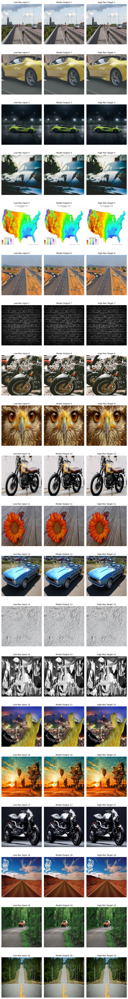

In [8]:
def show_predictions(model, lr_images, hr_images, n=5):
    preds = model.predict(lr_images[:n])
    plt.figure(figsize=(9, 3.5 * n))
    for i in range(n):
        plt.subplot(n, 3, i * 3 + 1)
        plt.imshow(lr_images[i])
        plt.title(f"Low-Res Input {i+1}", fontsize=10)
        plt.axis("off")

        plt.subplot(n, 3, i * 3 + 2)
        plt.imshow(np.clip(preds[i], 0, 1))
        plt.title(f"Model Output {i+1}", fontsize=10)
        plt.axis("off")

        plt.subplot(n, 3, i * 3 + 3)
        plt.imshow(hr_images[i])
        plt.title(f"High-Res Target {i+1}", fontsize=10)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_predictions(model, lr_test, hr_test, n=20)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step


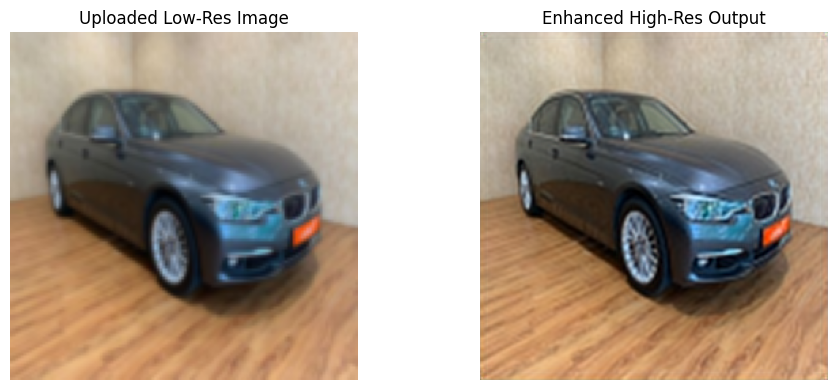

In [10]:
import cv2
from cv2 import dnn_superres
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
import os

model_path = r'C:\Users\Yousef\Documents\Image Super Resolution\best_srcnn_model.h5'
model = load_model(model_path, compile=False)

image_path = input("Enter the path to the low-resolution image: ").strip()

if not os.path.exists(image_path):
    raise FileNotFoundError(f"File not found: {image_path}")

img = Image.open(image_path).convert("RGB")
img = img.resize((128, 128))  
img_array = np.array(img) / 255.0
img_array = np.expand_dims(img_array, axis=0)

output = model.predict(img_array)[0]
output = np.clip(output, 0, 1)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(np.squeeze(img_array))
plt.title("Uploaded Low-Res Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(output)
plt.title("Enhanced High-Res Output")
plt.axis("off")

plt.tight_layout()
plt.show()
